# A Comparative Analysis of Several Trend Following Indicators, Signal Ensembling and Risk Based Portfolio Construction

In [1]:
%reset -f
%pylab inline
pylab.rcParams['figure.figsize'] = (15, 10)
pylab.style.use('ggplot')

Populating the interactive namespace from numpy and matplotlib


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statistics

import Backtester.Backtest as bt
from Backtester.SignalLibrary import Signals as sl
import Backtester.SignalHelper as sh

import seaborn as sns
from copy import deepcopy

Pulling miscellaneous price data, this may take a while...
Done!


In [15]:
# pull tickers
sig_tickers = pd.read_excel('gfut.xlsx', index_col=0)
ticker_list = list(sig_tickers['Ticker'])

# get data
#sig_assets = sl.signal_get_data(ticker_list, 'PX_LAST', '19750101').pull()
#sig_assets.columns = sig_tickers['Name']

# or just call the pickle file
sig_assets = pd.read_pickle('sig_assets.pkl').fillna(method='ffill',limit=2)

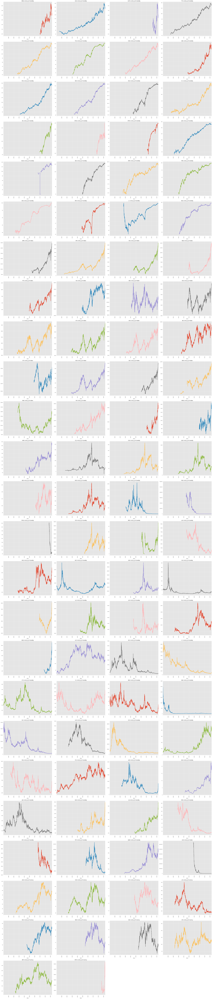

In [4]:
def subplot_df(df, nc, width_mult, height_mult):
    nr = int(nc*width_mult)
    fig_width = int(nc*width_mult)
    fig_height = int(nc*height_mult)
    with plt.style.context(('ggplot')):
        fig, ax = plt.subplots(figsize=(fig_width, fig_height))
        df.plot.line(subplots=True,layout=(nr,nc), ax=ax, rot=90,
                    title=list(df.columns), lw=3, legend=False)
        fig.tight_layout()
    return
        
subplot_df(sig_assets, 4, 10, 75)

In [16]:
sig_assets.loc[:'2010/9','KAA1 A:03_0_R Comdty'] = np.nan
sig_assets.loc[:'2008/05':,'MO1 A:03_0_R Comdty']= np.nan
sig_assets.loc[:'1998/08','SM1 A:03_0_R Index']= np.nan
sig_assets.drop(columns=['ES1 A:03_0_R Index',
                         'UXY1 A:03_0_R Comdty'], inplace=True)
sig_tickers.drop(index=['ES1','UXY1'],inplace=True)
tickers = sig_assets.columns.tolist()

test_assets = sig_assets.copy()

Text(0.5, 1.0, '# of Assets Per Asset Class')

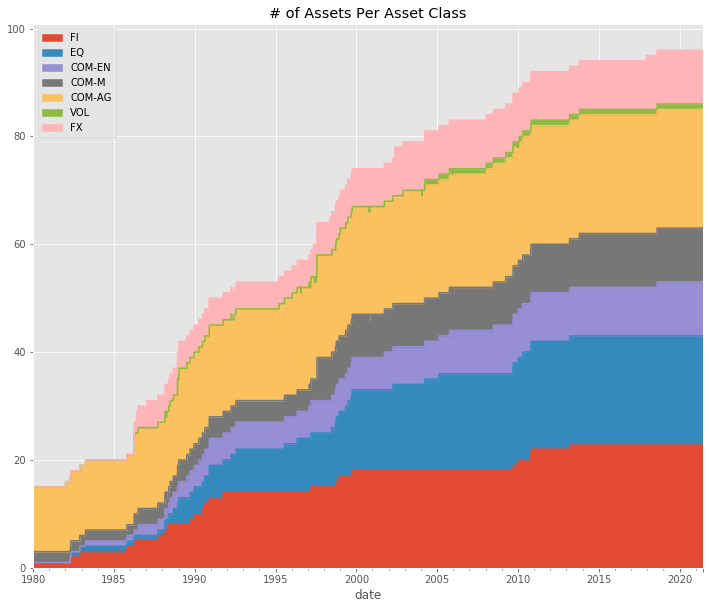

In [66]:
asset_classes = sig_tickers['AssetClass'].unique()
n_assets_df = pd.DataFrame(index=sig_assets.index, columns=asset_classes)

for ac in asset_classes:

    asset_tickers = sig_tickers.loc[sig_tickers['AssetClass'] ==
                                    ac, 'Ticker'].to_list()
    n_assets_df[ac] = (~sig_assets[asset_tickers].isnull()).sum(
        axis=1)['1980':]
n_assets_df['1980':].plot.area()
plt.title('# of Assets Per Asset Class')

In [18]:
params_dict = {
    'tsmom': {
        'lkbk': [5, 22, 66, 260],
        'type': ['ts', 'cs']
    },
    'macrossover': {
        'lkbk': [[3, 12], [8, 32], [32, 128], [66, 260]],
        'smooth_method': ['sma', 'ema'],
        'type': ['ts']
    },
    'breakout': {
        'lkbk': [5, 22, 66, 260],
        'type': ['ts', 'cs']
    },
    'ma_breakout': {
        'lkbk': [5, 22, 66, 260],
        'smooth_method': ['sma', 'ema'],
        'type': ['ts', 'cs']
    },
    'olstrend': {
        'lkbk': [22, 66, 260],
        'type': ['ts', 'cs']
    },
    'bollinger': {
        'lkbk': [5, 22, 66, 260],
        'type': ['ts']
    },
    'macd':{
        'lkbk_pair': [[12, 26], [32, 128], [66, 260]],
        'type': ['ts']
    },
    'rsi': {
        'lkbk': [22, 66, 260],
        'window': [5, 22, 66],
        'smooth_method': ['sma', 'ema'],
        'type': ['ts']
    },
    'kalmanfilter': {
        'burn_in': [21],
        'type': ['ts', 'cs']
    },
    'hpfilter': {
        'lkbk': [21],
        'type': ['ts', 'cs']
    },
    'mancross': {
        'coms': [[8, 24], [16, 48], [32, 96]],
        'type': ['ts', 'cs']
    },
    'sharpe': {
        'lkbk': [22, 66, 260],
        'type': ['cs']
    },
    'omega': {
        'lkbk': [22, 66, 260],
        'type': ['cs']
    },
    'sortino': {
        'lkbk': [22, 66, 260],
        'type': ['cs']
    },
    'calmar': {
        'lkbk': [22, 66, 260],
        'type': ['cs']
    },
    'dvr': {
        'lkbk': [22, 66, 260],
        'type': ['cs']
    },
    'var': {
        'lkbk': [22, 66, 260],
        'alpha': [0.05, 0.01],
        'type': ['cs']
    },
    'cvar': {
        'lkbk': [22, 66, 260],
        'alpha': [0.05, 0.01],
        'type': ['cs']
    },
    'maxloss': {
        'lkbk': [22, 66, 260],
        'type': ['cs']
    },
    'hilodiff': {
        'lkbk': [22, 66, 260],
        'type': ['cs']
    },
    'ulcer': {
        'lkbk': [22, 66, 260],
        'type': ['cs']
    }

}

In [19]:
models_dict = {}
signals_dict = {}
model_ids = []
perf_dict = {}
colors = [
    'blue', 'orange', 'green', 'red', 'black', 'purple', 'lime', 'dodgerblue',
    'deeppink', 'gold'
]
main_models = list(params_dict.keys())
for model in params_dict.keys():
    id_cats = [model + '_' + typ for typ in params_dict[model]['type']]
    for ix in range(len(id_cats)):
        model_ids.append(id_cats[ix])


def strat_plotter(perf_df, width=30, height=20):

    f, ax = plt.subplots(2, 2, figsize=(width, height))
    perf_df.apply(
        lambda x: x.dropna().mean() * np.sqrt(52) / x.dropna().std()).plot(
            kind='bar', ax=ax[0][0], title='Sharpe Ratios - Full Sample')
    ax[0][0].tick_params(axis='x', labelrotation=35)

    sharpe_df = perf_df.groupby(pd.Grouper(freq='12A')).\
                    apply(lambda x: x.mean()*np.sqrt(52)/x.std())
    sharpe_df.index = sharpe_df.index.strftime('%Y-%m-%d')
    sns.heatmap(sharpe_df.T,
                cmap='mako',
                linewidths=.5,
                annot_kws={'size': 12},
                annot=True,
                ax=ax[0][1])
    ax[0][1].set_title('Sharpe Ratios by Decade')
    ax[0][1].tick_params(axis='y', labelrotation=40)

    perf_df.cumsum().plot(ax=ax[1][0],
                          color=colors,
                          title='Cumulative Performance')

    sns.heatmap(perf_df.corr(),
                cmap='YlGn',
                linewidths=.5,
                annot_kws={'size': 12},
                annot=True,
                ax=ax[1][1])
    ax[1][1].set_title('Strategy Correlation')
    ax[1][1].tick_params(axis='y', labelrotation=40)


def run_ts_backtest(signal, model_id, risk_target=0.40):

    global signals_dict, perf_dict

    signals_dict[model_id] = deepcopy(signal)
    if 'olstrend_ts' in model_id:
        signals_dict[model_id].sigprocess_sizefunc(cutoff_args={
            'cutoffs': [-2, 2],
            'sign': [-1, 1]
        })
    else:
        signals_dict[model_id].sigprocess_sizefunc()
    signals_dict[model_id].signal_final.dropna(axis=1, how='all', inplace=True)
    col_ts = signals_dict[model_id].signal_final.dropna(axis=1,
                                                        how='all').columns

    bt_ts = bt.backtest(signals_dict[model_id],
                        test_assets[col_ts],
                        rebalancing='W')
    bt_ts.get_performance(risk_target=risk_target,
                          method_risksize='exponential',
                          risk_lkbk=60)
    perf_dict[model_id] = bt_ts.strat_df.mean(axis=1).copy()

    return signals_dict, perf_dict


def run_cs_backtest(signal, model_id, risk_target=0.40):

    global signals_dict, perf_dict

    signals_dict[model_id] = deepcopy(signal)
    signals_dict[model_id].sigprocess_cs_rankweights()
    signals_dict[model_id].sigprocess_sizefunc()
    signals_dict[model_id].signal_final.dropna(axis=1, how='all', inplace=True)
    col_cs = signals_dict[model_id].signal_final.dropna(axis=1,
                                                        how='all').columns

    bt_cs = bt.backtest(signals_dict[model_id],
                        test_assets[col_cs],
                        rebalancing='W')
    bt_cs.get_performance(risk_target=risk_target,
                          method_risksize='exponential',
                          risk_lkbk=60)
    perf_dict[model_id] = bt_cs.strat_df.mean(axis=1).copy()
    return signals_dict, perf_dict

In [20]:
print('Computing {}...'.format(main_models[0]))
for lkbk in params_dict['tsmom']['lkbk']:

    ts_id = model_ids[0] + '_{}'.format(lkbk)
    cs_id = model_ids[1] + '_{}'.format(lkbk)

    signal = sl.signal_mom_tsmom(sig_assets, lkbk).gen_signal()
    signals_dict, perf_dict = run_ts_backtest(signal, ts_id, risk_target=0.40)
    signals_dict, perf_dict = run_cs_backtest(signal, cs_id, risk_target=0.40)

Computing tsmom...
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced pos

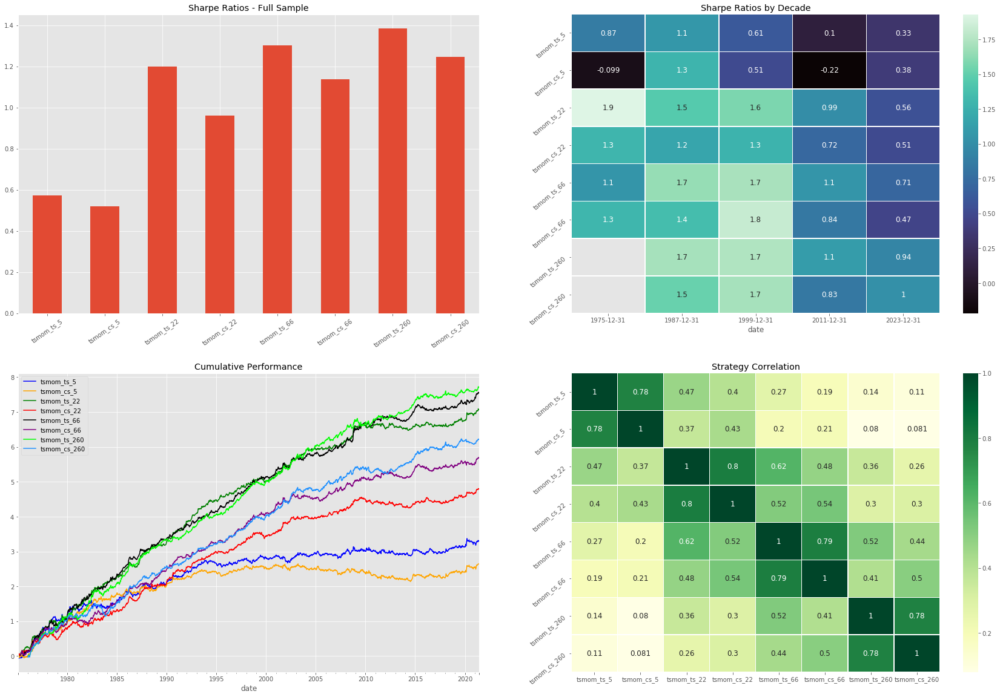

In [21]:
keys =['tsmom_ts_5', 'tsmom_cs_5', 'tsmom_ts_22', 'tsmom_cs_22', 
       'tsmom_ts_66', 'tsmom_cs_66', 'tsmom_ts_260', 'tsmom_cs_260']
perf_df = pd.concat(perf_dict, axis=1, keys=perf_dict.keys()).dropna(how='all')[keys]

strat_plotter(perf_df)

In [22]:
print('Computing {}...'.format(main_models[1]))
for lkbk_pair in params_dict['macrossover']['lkbk']:
    for smooth_method in params_dict['macrossover']['smooth_method']:
        ts_id = model_ids[2] + '_{}-{}_{}'.format(lkbk_pair[0], lkbk_pair[1],
                                                  smooth_method)

        signal = sl.signal_mom_macrossover(sig_assets, lkbk_pair,
                                           smooth_method).gen_signal()
        signals_dict, perf_dict = run_ts_backtest(signal,
                                                  ts_id,
                                                  risk_target=0.40)
        signals_dict, perf_dict = run_cs_backtest(signal,
                                                  cs_id,
                                                  risk_target=0.40)

Computing macrossover...
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanc

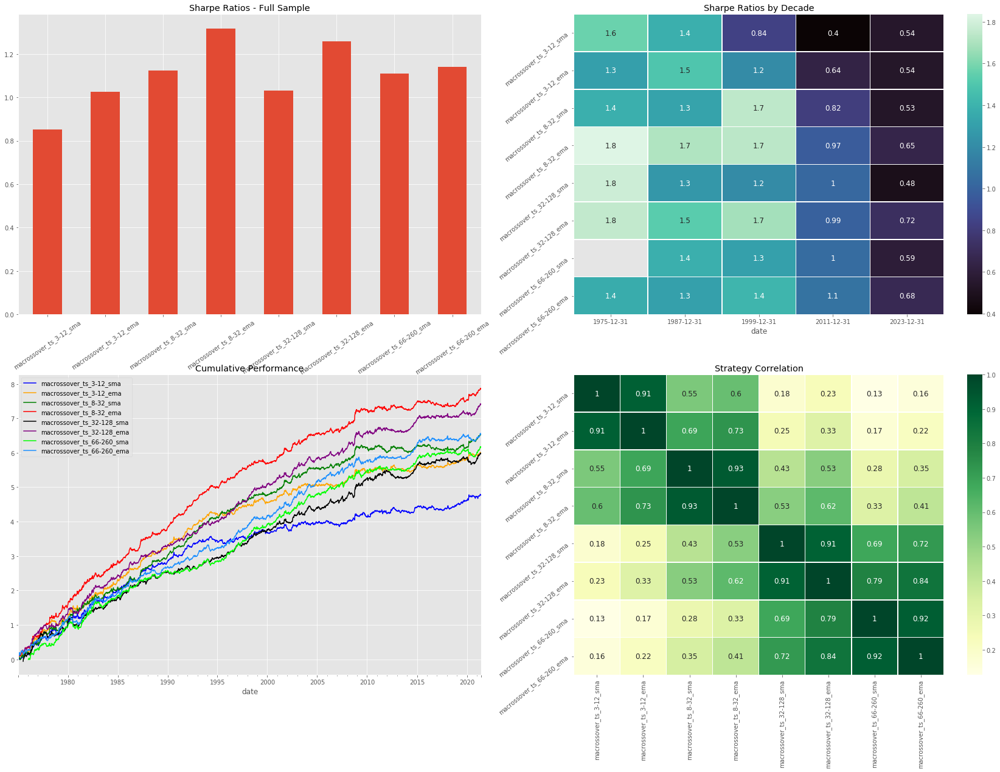

In [23]:
keys =['macrossover_ts_3-12_sma', 'macrossover_ts_3-12_ema',
       'macrossover_ts_8-32_sma', 'macrossover_ts_8-32_ema', 
       'macrossover_ts_32-128_sma','macrossover_ts_32-128_ema',
       'macrossover_ts_66-260_sma', 'macrossover_ts_66-260_ema']
perf_df = pd.concat(perf_dict, axis=1, keys=perf_dict.keys()).dropna(how='all')[keys]
strat_plotter(perf_df)

In [24]:
print('Computing {}...'.format(main_models[2]))
for lkbk in params_dict['breakout']['lkbk']:

    ts_id = model_ids[3] + '_{}'.format(lkbk)
    cs_id = model_ids[4] + '_{}'.format(lkbk)

    signal = sl.signal_mom_breakout(sig_assets, lkbk,
                                    smooth_method=None).gen_signal()
    signals_dict, perf_dict = run_ts_backtest(signal, ts_id, risk_target=0.40)
    signals_dict, perf_dict = run_cs_backtest(signal, cs_id, risk_target=0.40)

Computing breakout...
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced 

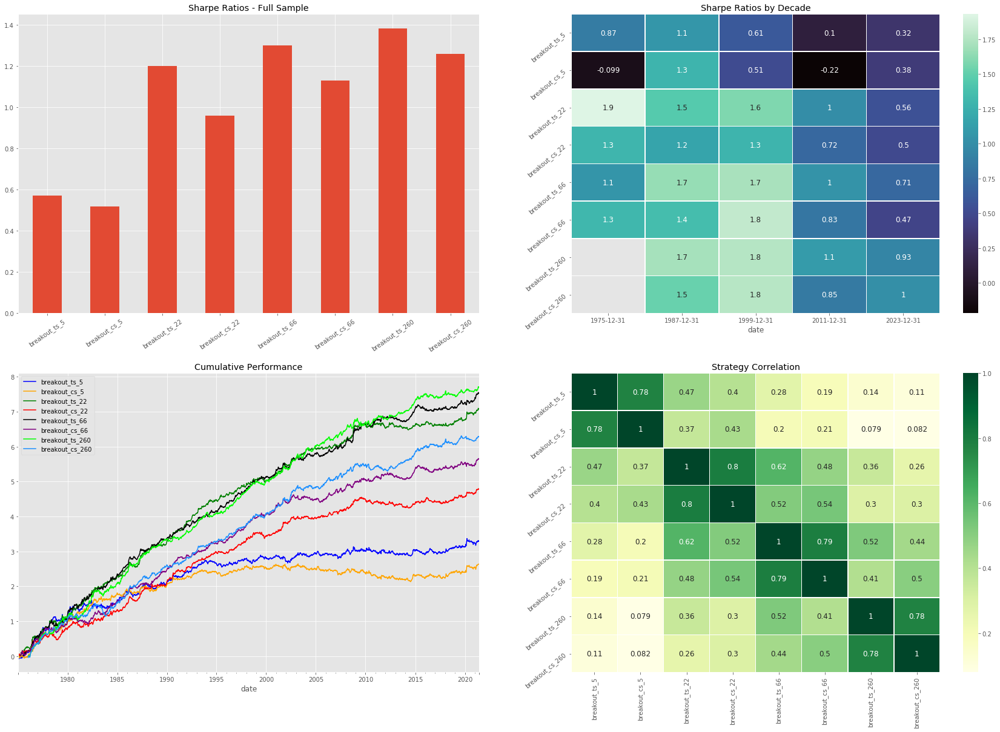

In [25]:
keys =['breakout_ts_5','breakout_cs_5', 
       'breakout_ts_22', 'breakout_cs_22',
       'breakout_ts_66', 'breakout_cs_66',
       'breakout_ts_260', 'breakout_cs_260']
perf_df = pd.concat(perf_dict, axis=1, keys=perf_dict.keys()).dropna(how='all')[keys]

strat_plotter(perf_df)

In [26]:
print('Computing {}...'.format(main_models[3]))
for lkbk in params_dict['ma_breakout']['lkbk']:
    for smooth_method in params_dict['ma_breakout']['smooth_method']:

        ts_id = model_ids[5] + '_{}_{}'.format(lkbk, smooth_method)
        cs_id = model_ids[6] + '_{}_{}'.format(lkbk, smooth_method)

        signal = sl.signal_mom_breakout(
            sig_assets, lkbk, smooth_method=smooth_method).gen_signal()
        signals_dict, perf_dict = run_ts_backtest(signal,
                                                  ts_id,
                                                  risk_target=0.40)
        signals_dict, perf_dict = run_cs_backtest(signal,
                                                  cs_id,
                                                  risk_target=0.40)

Computing ma_breakout...
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanc

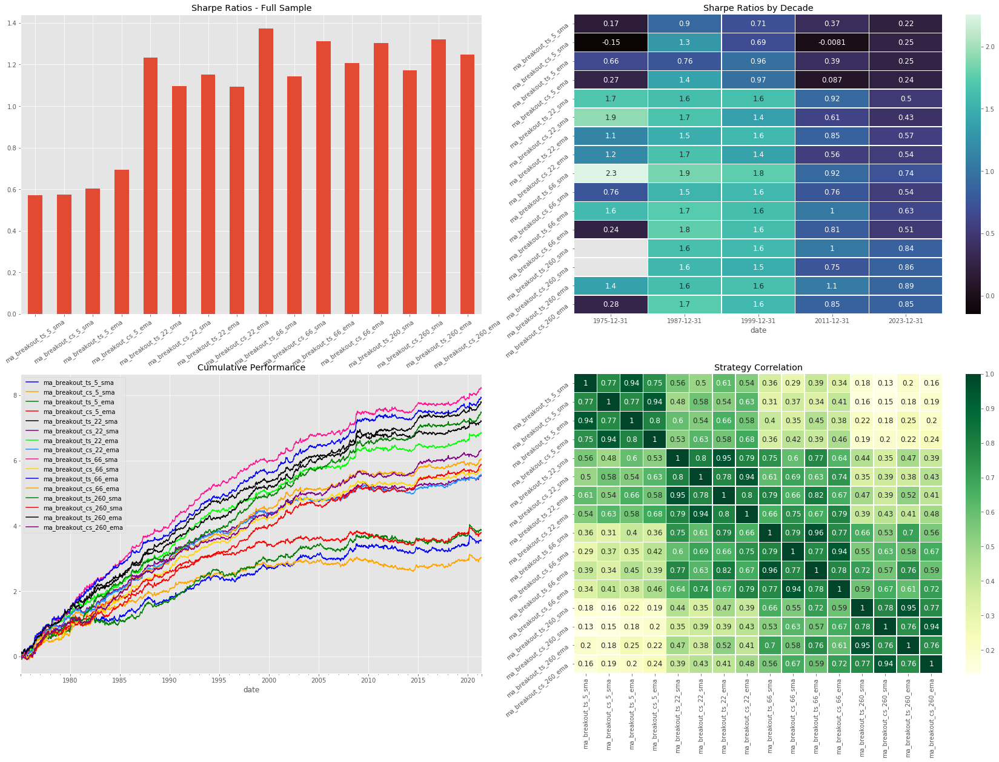

In [27]:
keys =['ma_breakout_ts_5_sma', 'ma_breakout_cs_5_sma', 'ma_breakout_ts_5_ema', 'ma_breakout_cs_5_ema',
       'ma_breakout_ts_22_sma', 'ma_breakout_cs_22_sma', 'ma_breakout_ts_22_ema', 'ma_breakout_cs_22_ema',
       'ma_breakout_ts_66_sma', 'ma_breakout_cs_66_sma', 'ma_breakout_ts_66_ema', 'ma_breakout_cs_66_ema', 
       'ma_breakout_ts_260_sma', 'ma_breakout_cs_260_sma', 'ma_breakout_ts_260_ema', 'ma_breakout_cs_260_ema']
perf_df = pd.concat(perf_dict, axis=1, keys=perf_dict.keys()).dropna(how='all')[keys]

strat_plotter(perf_df)

In [28]:
print('Computing {}...'.format(main_models[4]))
for lkbk in params_dict['olstrend']['lkbk']:

    signal = sl.signal_mom_olstrend(sig_assets, lkbk).gen_signal()
    ts_id = model_ids[7] + '_{}'.format(lkbk)
    cs_id = model_ids[8] + '_{}'.format(lkbk)

    signals_dict, perf_dict = run_ts_backtest(signal, ts_id, risk_target=0.40)
    signals_dict, perf_dict = run_cs_backtest(signal, cs_id, risk_target=0.40)

Computing olstrend...
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced 

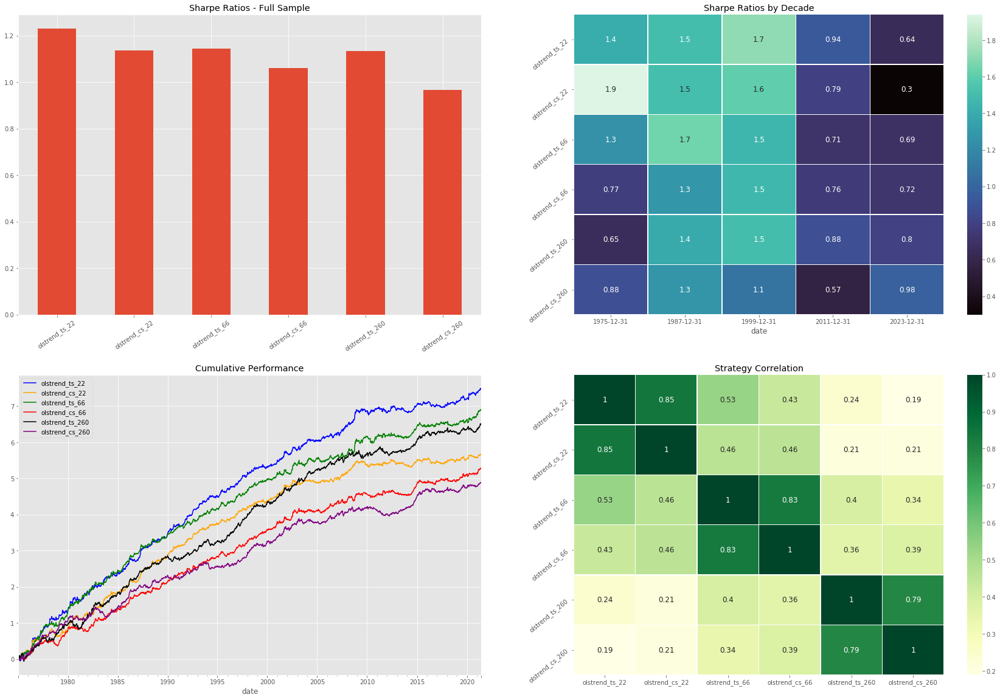

In [29]:
keys =['olstrend_ts_22', 'olstrend_cs_22', 'olstrend_ts_66', 
       'olstrend_cs_66', 'olstrend_ts_260', 'olstrend_cs_260']
perf_df = pd.concat(perf_dict, axis=1, keys=perf_dict.keys()).dropna(how='all')[keys]

strat_plotter(perf_df)

In [30]:
print('Computing {}...'.format(main_models[5]))
for lkbk in params_dict['bollinger']['lkbk']:
    ts_id = model_ids[9] + '_{}'.format(lkbk)
    signal = sl.signal_mom_bollingerbands(sig_assets, lkbk, 2).gen_signal()

    signals_dict, perf_dict = run_ts_backtest(signal, ts_id, risk_target=0.40)

Computing bollinger...
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced

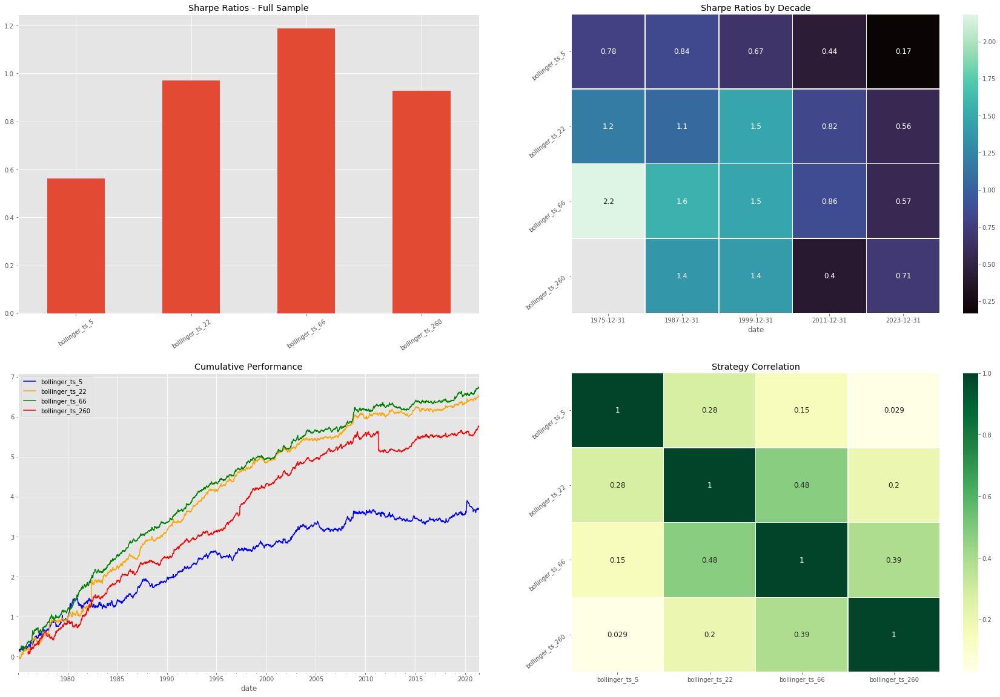

In [31]:
keys =['bollinger_ts_5', 'bollinger_ts_22',
       'bollinger_ts_66', 'bollinger_ts_260']
perf_df = pd.concat(perf_dict, axis=1, keys=perf_dict.keys()).dropna(how='all')[keys]

strat_plotter(perf_df)

In [32]:
for lkbk_pair in params_dict['macd']['lkbk_pair']:
    ts_id = model_ids[10] + '_{}_{}'.format(lkbk_pair[0],lkbk_pair[1])
    signal = sl.signal_mom_macd(sig_assets, lkbk_pair).gen_signal()
    signals_dict, perf_dict = run_ts_backtest(signal, ts_id, risk_target=0.40)

Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy 

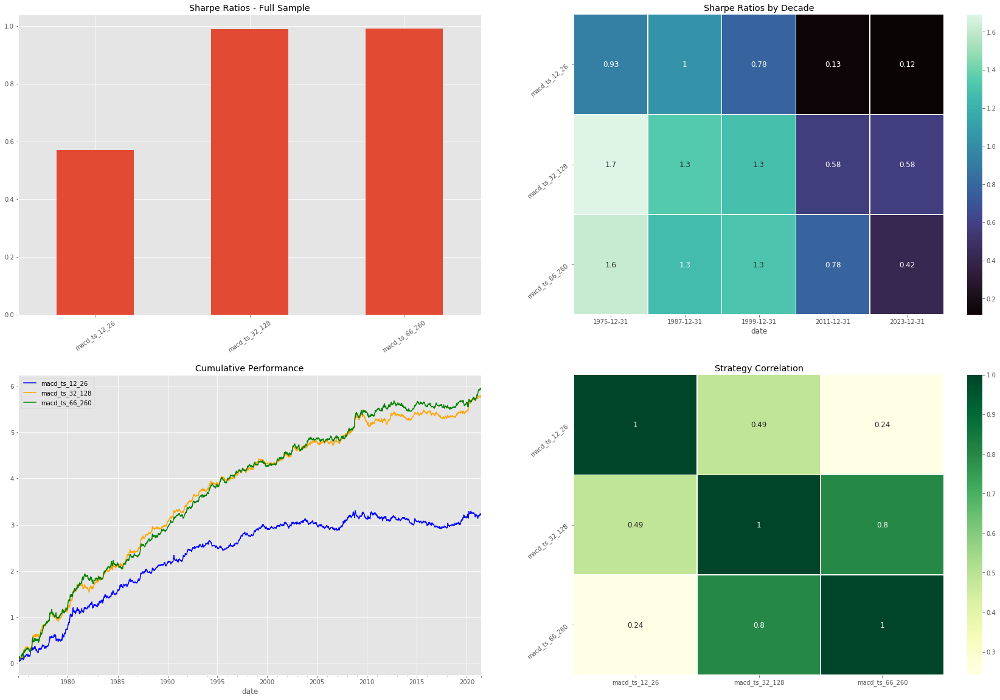

In [33]:
keys =['macd_ts_12_26', 'macd_ts_32_128', 'macd_ts_66_260']
perf_df = pd.concat(perf_dict, axis=1, keys=perf_dict.keys()).dropna(how='all')[keys]

strat_plotter(perf_df)

In [48]:
print('Computing {}...'.format(main_models[7]))
for ix in range(len(params_dict['rsi']['lkbk'])):
    lkbk = params_dict['rsi']['lkbk'][ix]
    window = params_dict['rsi']['window'][ix]
    for smooth_method in params_dict['rsi']['smooth_method']:
        ts_id = model_ids[11] + '_{}_{}'.format(lkbk, smooth_method)
        signal = sl.signal_mom_rsi(sig_assets, lkbk, window,
                                   smooth_method).gen_signal()
        signals_dict, perf_dict = run_ts_backtest(signal,
                                                  ts_id,
                                                  risk_target=0.40)

Computing rsi...
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced posit

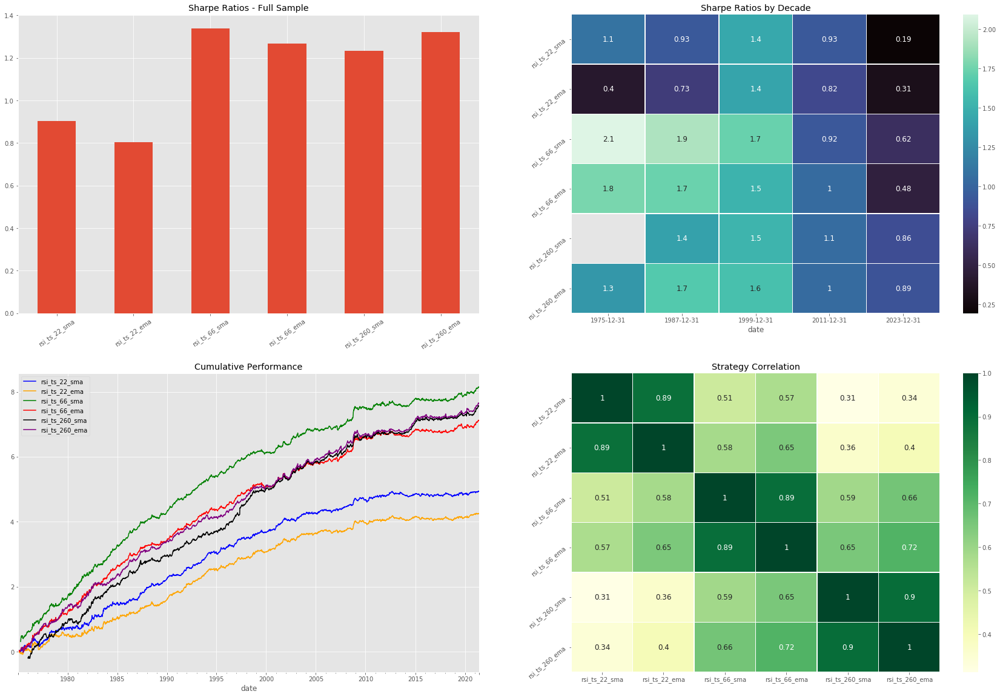

In [49]:
keys =['rsi_ts_22_sma', 'rsi_ts_22_ema', 'rsi_ts_66_sma', 
       'rsi_ts_66_ema', 'rsi_ts_260_sma', 'rsi_ts_260_ema']
perf_df = pd.concat(perf_dict, axis=1, keys=perf_dict.keys()).dropna(how='all')[keys]

strat_plotter(perf_df)

In [52]:
signal_kalman = sl.signal_mom_kalmanfilter(sig_assets).gen_signal()
signal_hpfilter = sl.signal_mom_hpfilter(sig_assets).gen_signal()

signals_dict, perf_dict = run_ts_backtest(signal_kalman,
                                          model_ids[12],
                                          risk_target=0.40)

signals_dict, perf_dict = run_cs_backtest(signal_kalman,
                                          model_ids[13],
                                          risk_target=0.40)

signals_dict, perf_dict = run_ts_backtest(signal_hpfilter,
                                          model_ids[14],
                                          risk_target=0.40)

signals_dict, perf_dict = run_cs_backtest(signal_hpfilter,
                                          model_ids[15],
                                          risk_target=0.40)

Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy 

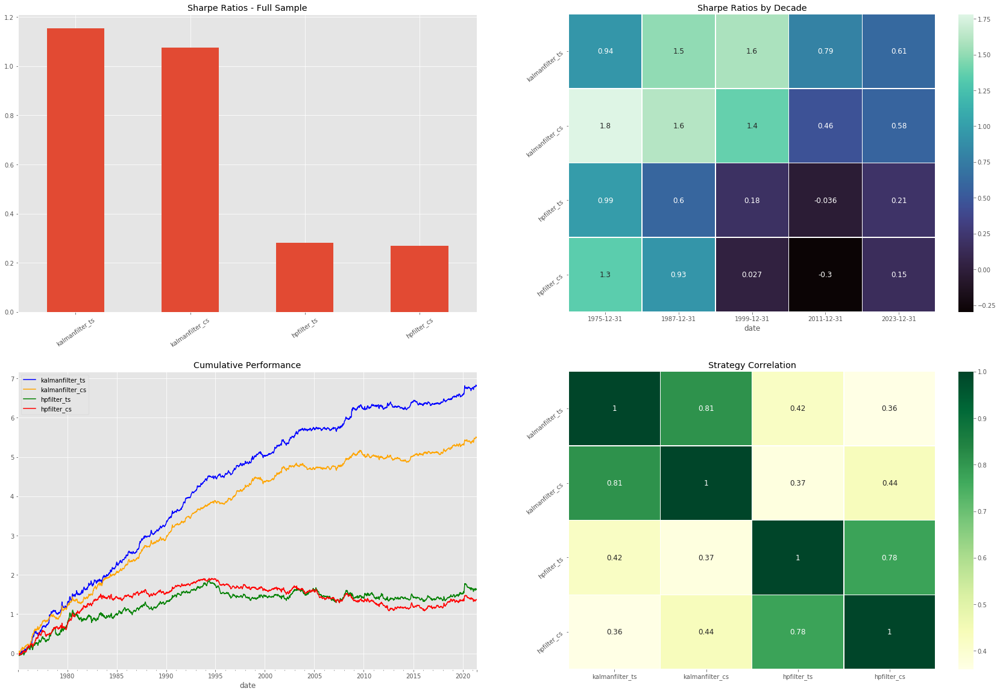

In [53]:
keys =['kalmanfilter_ts', 'kalmanfilter_cs', 'hpfilter_ts', 'hpfilter_cs']
perf_df = pd.concat(perf_dict, axis=1, keys=perf_dict.keys()).dropna(how='all')[keys]

strat_plotter(perf_df)

In [54]:
for com in params_dict['mancross']['coms']:

    ts_id = model_ids[16] + '_{}_{}'.format(com[0], com[1])
    cs_id = model_ids[17] + '_{}_{}'.format(com[0], com[1])

    signal = sl.signal_mom_mancross(sig_assets, coms=com).gen_signal()

    signals_dict, perf_dict = run_ts_backtest(signal, ts_id, risk_target=0.40)
    signals_dict, perf_dict = run_cs_backtest(signal, cs_id, risk_target=0.40)

Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy 

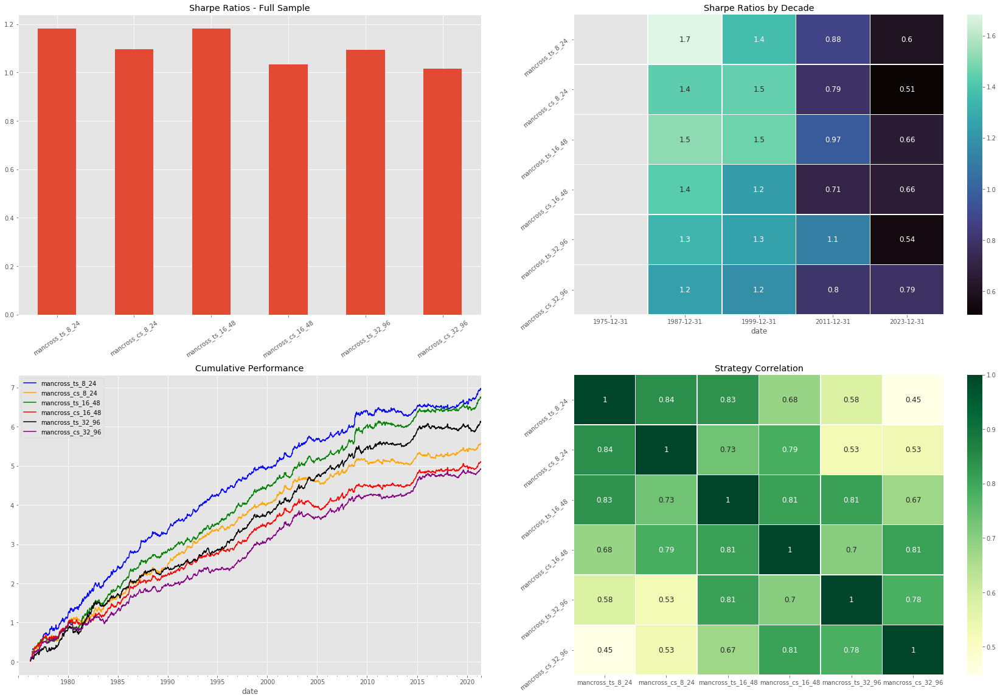

In [55]:
keys =['mancross_ts_8_24', 'mancross_cs_8_24', 'mancross_ts_16_48',
       'mancross_cs_16_48', 'mancross_ts_32_96', 'mancross_cs_32_96']
perf_df = pd.concat(perf_dict, axis=1, keys=perf_dict.keys()).dropna(how='all')[keys]

strat_plotter(perf_df)

In [56]:
for lkbk in [5, 22, 66, 260]:

    signal_sharpe = sl.signal_mom_sharpe(sig_assets, lkbk).gen_signal()
    signal_omega = sl.signal_mom_omega(sig_assets, lkbk).gen_signal()
    signal_sortino = sl.signal_mom_sortino(sig_assets, lkbk).gen_signal()
    signal_calmar = sl.signal_mom_calmar(sig_assets, lkbk).gen_signal()
    signal_dvr = sl.signal_mom_dvr(sig_assets, lkbk).gen_signal()
    signal_var = sl.signal_mom_var(sig_assets, lkbk).gen_signal()
    signal_cvar = sl.signal_mom_cvar(sig_assets, lkbk).gen_signal()
    signal_maxloss = sl.signal_mom_maxloss(sig_assets, lkbk).gen_signal()
    signal_hilodiff = sl.signal_mom_hilodiff(sig_assets, lkbk).gen_signal()
    signal_ulcer = sl.signal_mom_ulcer(sig_assets, lkbk).gen_signal()
    

    cs_id = model_ids[18] + '_{}'.format(lkbk)
    signals_dict, perf_dict = run_cs_backtest(signal_sharpe,
                                              cs_id,
                                              risk_target=0.40)

    cs_id = model_ids[19] + '_{}'.format(lkbk)
    signals_dict, perf_dict = run_cs_backtest(signal_omega,
                                              cs_id,
                                              risk_target=0.40)

    cs_id = model_ids[20] + '_{}'.format(lkbk)
    signals_dict, perf_dict = run_cs_backtest(signal_sortino,
                                              cs_id,
                                              risk_target=0.40)

    cs_id = model_ids[21] + '_{}'.format(lkbk)
    signals_dict, perf_dict = run_cs_backtest(signal_calmar,
                                              cs_id,
                                              risk_target=0.40)

    cs_id = model_ids[22] + '_{}'.format(lkbk)
    signals_dict, perf_dict = run_cs_backtest(signal_dvr,
                                              cs_id,
                                              risk_target=0.40)

    cs_id = model_ids[23] + '_{}'.format(lkbk)
    signals_dict, perf_dict = run_cs_backtest(signal_var,
                                              cs_id,
                                              risk_target=0.40)

    cs_id = model_ids[24] + '_{}'.format(lkbk)
    signals_dict, perf_dict = run_cs_backtest(signal_cvar,
                                              cs_id,
                                              risk_target=0.40)

    cs_id = model_ids[25] + '_{}'.format(lkbk)
    signals_dict, perf_dict = run_cs_backtest(signal_maxloss,
                                              cs_id,
                                              risk_target=0.40)

    cs_id = model_ids[26] + '_{}'.format(lkbk)
    signals_dict, perf_dict = run_cs_backtest(signal_hilodiff,
                                              cs_id,
                                              risk_target=0.40)

    cs_id = model_ids[27] + '_{}'.format(lkbk)
    signals_dict, perf_dict = run_cs_backtest(signal_ulcer,
                                              cs_id,
                                              risk_target=0.40)

Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy 

Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!
Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 98, # of Assets 98
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating posi

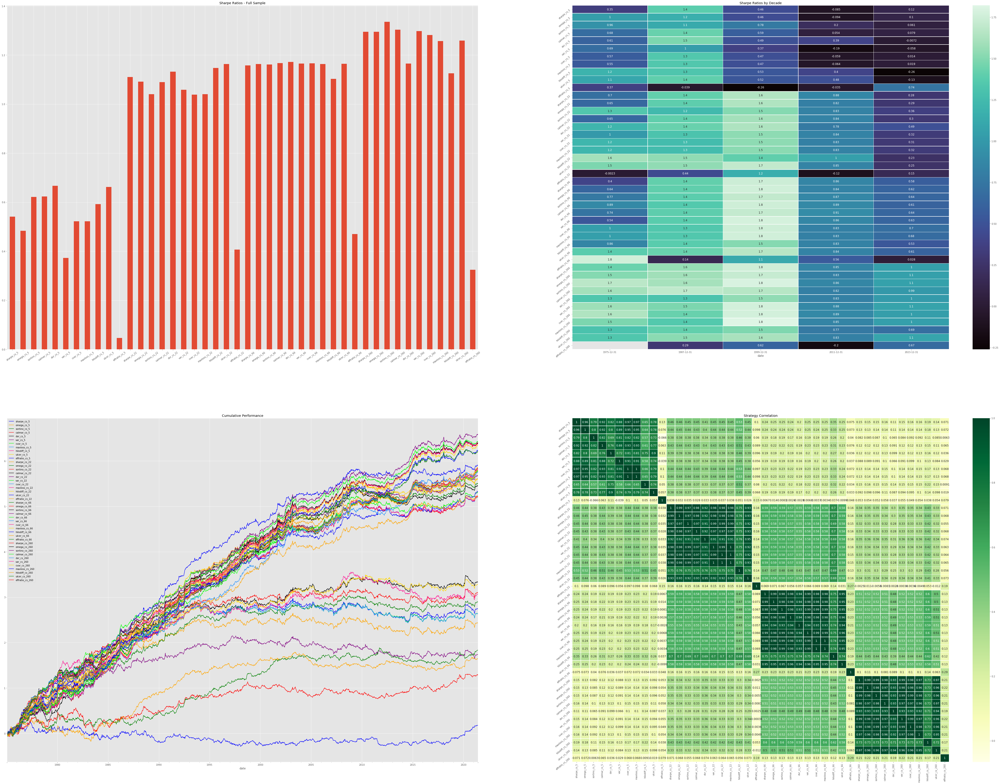

In [39]:
keys =['sharpe_cs_5', 'omega_cs_5', 'sortino_cs_5', 'calmar_cs_5', 'dvr_cs_5', 'var_cs_5', 
       'cvar_cs_5', 'maxloss_cs_5', 'hilodiff_cs_5', 'ulcer_cs_5', 'effratio_cs_5', 'sharpe_cs_22', 
       'omega_cs_22', 'sortino_cs_22', 'calmar_cs_22', 'dvr_cs_22', 'var_cs_22', 'cvar_cs_22', 
       'maxloss_cs_22', 'hilodiff_cs_22', 'ulcer_cs_22', 'effratio_cs_22', 'sharpe_cs_66', 
       'omega_cs_66', 'sortino_cs_66', 'calmar_cs_66', 'dvr_cs_66', 'var_cs_66', 'cvar_cs_66', 
       'maxloss_cs_66', 'hilodiff_cs_66', 'ulcer_cs_66', 'effratio_cs_66', 'sharpe_cs_260', 
       'omega_cs_260', 'sortino_cs_260', 'calmar_cs_260', 'dvr_cs_260', 'var_cs_260', 
       'cvar_cs_260', 'maxloss_cs_260', 'hilodiff_cs_260', 'ulcer_cs_260', 'effratio_cs_260']
perf_df = pd.concat(perf_dict, axis=1, keys=perf_dict.keys()).dropna(how='all')[keys]
strat_plotter(perf_df, 80, 60)

In [80]:
df = pd.DataFrame(index=sig_assets.index, columns=signals_dict.keys())
signal_ids = list(signals_dict.keys())
asset_sigs = {}
for asset in tickers:
    ticker = 'RX_' + asset
    temp_df = df.copy()
    for signal in signal_ids:
        try:
            temp_df[signal] = signals_dict[signal].signal_final[ticker].copy()
        except: continue
        asset_sigs[asset] = temp_df.copy()

In [382]:
def get_signal_mode(x):
    
    try:
        return statistics.mode(x)
    except:
        uniques = np.unique(x)
        n_uni = []
        for unique in uniques:
            n_uni.append(np.sum(x==unique))
        max_ix = (n_uni == np.max(n_uni))
        if np.sum(max_ix) > 1:
            return np.mean(uniques[max_ix])
        else: 
            return uniques[max_ix][0]
        
signal_agg_df = pd.DataFrame(index=sig_assets.index)
signal_agg_df.index.name = 'date'

for ticker in asset_sigs.keys():
    temp = asset_sigs[ticker].apply(mean, axis=1).to_frame(ticker)
    signal_agg_df = pd.concat([signal_agg_df, temp], axis=1)

$$r_{CTA, t+1} = \frac{1}{N}\sum_{i=1}^{N}X_{i,t}\frac{\sigma_{tgt}}{\sigma_{i, t}} r^{i}_{i,t+1}$$
$$X_{i,t} \in {[-1,1]}$$
$$X_{i,t} = \frac{1}{M}\sum_{m=1}^{M}S_{m,i,t}$$
$$S_{m,i,t} \in {[-1,0,1]}$$

In [408]:
assets = signal_agg_df.columns
sig_agg = sl.signal_userdefined(signal_agg_df)

backtester = bt.backtest(sig_agg, test_assets[assets], rebalancing='W')
backtester.get_performance(risk_target=0.4, 
                           method_risksize='exponential', risk_lkbk=60)

Initiating Backtester
Calculating excess returns...
Backtesting: # of Signals: 96, # of Assets 96
Initiating risk sizing...
Calculating risk for each strategy...
Risk method: exponential
Calculating risk size with risk target: 40.0%...
Calculating position size, rebalanced position and strategy performance
Calculating performance statistics...
Done!


In [409]:
backtester.strat_stats_agg

RX_WN1 A:03_0_R Comdty  \
Performance Stats Mean                                 0.025165   
                  Volatility                           0.404869   
                  Skewness                             0.097847   
                  Kurtosis                             0.081125   
                  Strategy Sharpe Ratio                0.062156   
                  t-Stats                              0.210075   
                  Sortino Ratio                        0.095997   
                  Calmar Ratio                         0.030672   
                  Signal Sharpe                        0.029192   
                  Test Asset Sharpe                    0.471829   
                  Max Drawdown                         0.820450   
                  Max Drawdown Duration                6.288462   
                  Max Duration Sharpe                 -0.540972   
Correlations      S&P500                              -0.245167   
                  US10Y                                0.225529   
                  CAD10Y                               0.201622   
                  GOLD                                 0.035916   
                  BE05Y                               -0.183600   
                  ACWI                                -0.256133   
                  6040_US                             -0.211885   

                                         RX_US1 A:03_0_R Comdty  \
Performance Stats Mean                                 0.157769   
                  Volatility                           0.413165   
                  Skewness                             0.015480   
                  Kurtosis                             0.057481   
                  Strategy Sharpe Ratio                0.381854   
                  t-Stats                              2.530719   
                  Sortino Ratio                        0.547881   
                  Calmar Ratio                         0.165074   
                  Signal Sharpe                        0.284439   
                  Test Asset Sharpe                    0.368849   
                  Max Drawdown                         0.955744   
                  Max Drawdown Duration               19.326923   
                  Max Duration Sharpe                 -0.183747   
Correlations      S&P500                              -0.212745   
                  US10Y                                0.229389   
                  CAD10Y                               0.202711   
                  GOLD                                 0.019372   
                  BE05Y                               -0.142029   
                  ACWI                                -0.225621   
                  6040_US                             -0.177114   

                                         RX_TY1 A:03_0_R Comdty  \
Performance Stats Mean                                 0.184731   
                  Volatility                           0.426684   
                  Skewness                             0.003622   
                  Kurtosis                             0.056261   
                  Strategy Sharpe Ratio                0.432945   
                  t-Stats                              2.711065   
                  Sortino Ratio                        0.611283   
                  Calmar Ratio                         0.203389   
                  Signal Sharpe                        0.419949   
                  Test Asset Sharpe                    0.671076   
                  Max Drawdown                         0.908266   
                  Max Drawdown Duration                8.750000   
                  Max Duration Sharpe                 -0.449574   
Correlations      S&P500                              -0.209981   
                  US10Y                                0.320386   
                  CAD10Y                               0.264841   
                  GOLD                                 0.066715   
                  B

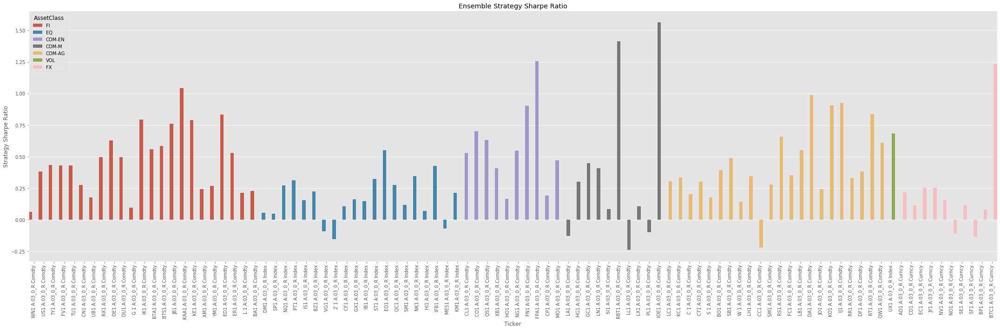

In [410]:
strat_stats = backtester.strat_stats_agg.loc(axis=0)\
    ['Performance Stats', ['Mean','Volatility','Strategy Sharpe Ratio', 'Skewness']].droplevel(axis=0,level=0).T
strat_stats.index = [strng[3:] for strng in strat_stats.index]
strat_stats = strat_stats.reset_index().rename(columns={'index':'Ticker'}).\
                        merge(sig_tickers[['Ticker','AssetClass']].\
                              reset_index(drop=True), on='Ticker', how='inner')



def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        patch.set_width(new_value)
        patch.set_x(patch.get_x() + diff * .5)


f, ax = plt.subplots(figsize=(30,10))
sns.barplot(x='Ticker', 
            y='Strategy Sharpe Ratio',
            hue='AssetClass', 
            data=strat_stats, 
            ax=ax)
change_width(ax, .35)
plt.xticks(rotation=90)
plt.title('Ensemble Strategy Sharpe Ratio')
plt.tight_layout()

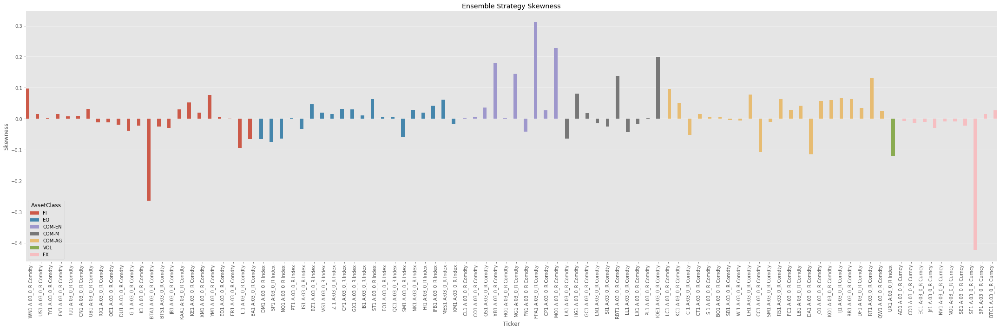

In [411]:
f, ax = plt.subplots(figsize=(30,10))
sns.barplot(x='Ticker', 
            y='Skewness',
            hue='AssetClass', 
            data=strat_stats, 
            ax=ax)
change_width(ax, .35)
plt.xticks(rotation=90)
plt.title('Ensemble Strategy Skewness')
plt.tight_layout()

Text(0.5, 1.0, 'Sharpe Ratios Across Models')

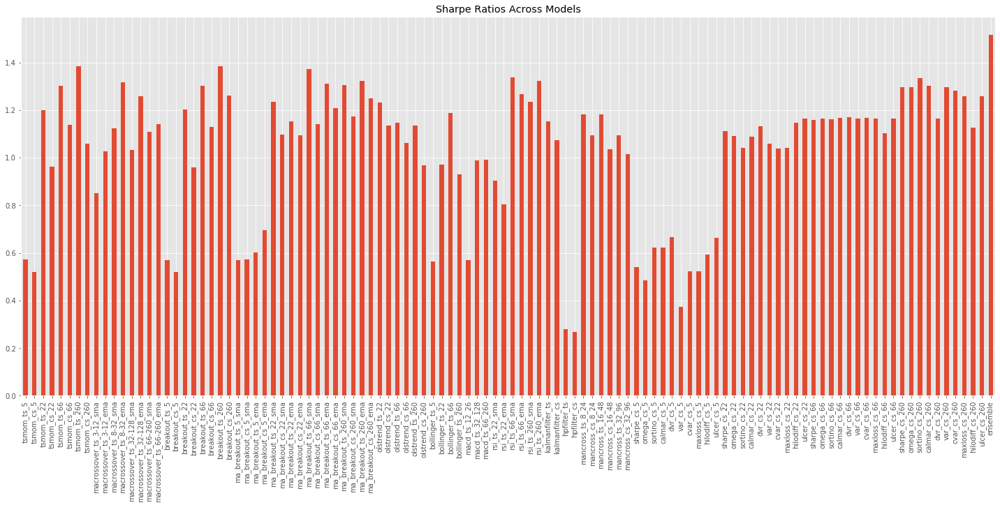

In [412]:
perf_df = pd.concat(perf_dict, axis=1, keys=perf_dict.keys()).dropna(how='all')[signals_dict.keys()]
perf_df = pd.concat([perf_df, backtester.strat_df.mean(axis=1).\
                     to_frame('ensemble')], axis=1)

f, ax = plt.subplots(figsize=(25,10))

perf_df.apply(lambda x: x.mean()*np.sqrt(52)/x.std()).plot(kind='bar', ax=ax)
plt.title('Sharpe Ratios Across Models')

Text(0.5, 1, 'Sharpe Ratios by Decades - All Models')

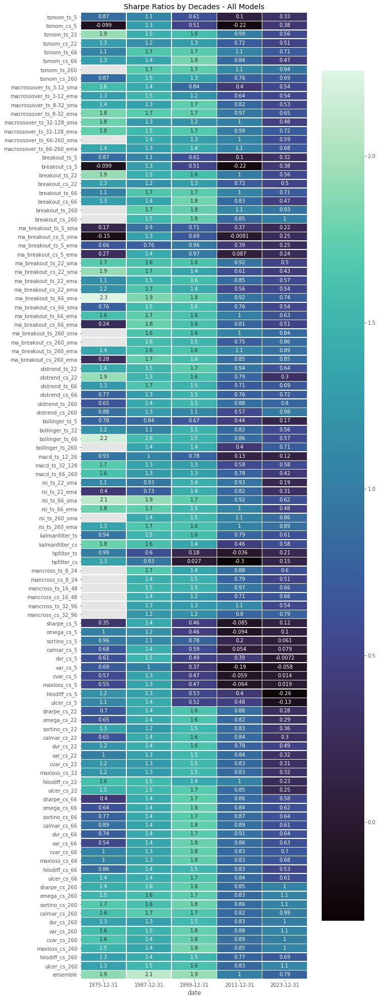

In [401]:
f, ax = plt.subplots(figsize=(10,35))
sharpe_df = perf_df.groupby(pd.Grouper(freq='12A')).\
                apply(lambda x: x.mean()*np.sqrt(52)/x.std())
sharpe_df.index = sharpe_df.index.strftime('%Y-%m-%d')
sns.heatmap(sharpe_df.T,
            cmap='mako',
            linewidths=.5,
            annot_kws={'size': 10},
            annot=True,
            ax=ax)

plt.title('Sharpe Ratios by Decades - All Models')

Text(0.5, 1.0, 'CTA Performance Against Stocks & Bonds - 10% Vol')

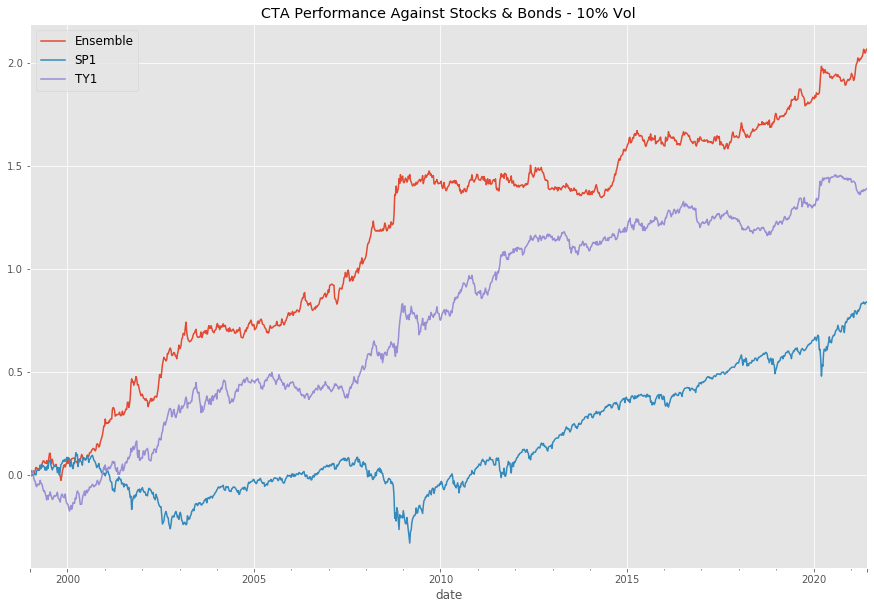

In [419]:
comp_df = pd.concat([backtester.strat_df.dropna(how='all').mean(axis=1).to_frame('ensemble'),
                     backtester.test_rebalanced[['RX_SP1 A:03_0_R Index', 'RX_TY1 A:03_0_R Comdty']]], axis=1)

f, ax = plt.subplots(figsize=(15,10))
comp_df['1999/01':].apply(lambda x: x*(0.10/(x.std()*np.sqrt(52)))).cumsum().plot(ax=ax)
plt.legend(['Ensemble', 'SP1', 'TY1'], fontsize=12)
plt.title('CTA Performance Against Stocks & Bonds - 10% Vol')

In [249]:
def corr_hat(df, estimate):
    corr_mat = df.dropna(how='all', axis=0).dropna(axis=1).values
    upper_corr = corr_mat[np.triu_indices(corr_mat.shape[0], k = 1)]
    n = corr_mat.shape[0]

    if estimate is 'median':
        return pd.Series(np.median(upper_corr))
    if estimate is 'mean':
        return pd.Series(np.sum(upper_corr)*(2/(n*(n-1))))


rollingcorr_df = backtester.test_rebalanced.rolling(63).corr()
rhohat_df = rollingcorr_df.dropna(how='all').groupby('date').apply(lambda x: corr_hat(x,'mean'))

In [423]:
comp_df

,ensemble,RX_SP1 A:03_0_R Index,RX_TY1 A:03_0_R Comdty
date,,,
1975-01-05,NaN,NaN,NaN
1975-01-12,NaN,NaN,NaN
1975-01-19,0.053383,NaN,NaN
1975-01-26,-0.022038,NaN,NaN
1975-02-02,-0.013015,NaN,NaN
...,...,...,...
2021-05-16,-0.007005,-0.013325,-0.002607
2021-05-23,-0.015570,-0.004102,0.000238
2021-05-30,0.009195,0.012187,0.003089


Text(0.5, 1.0, 'Average Correlation - CTA Universe')

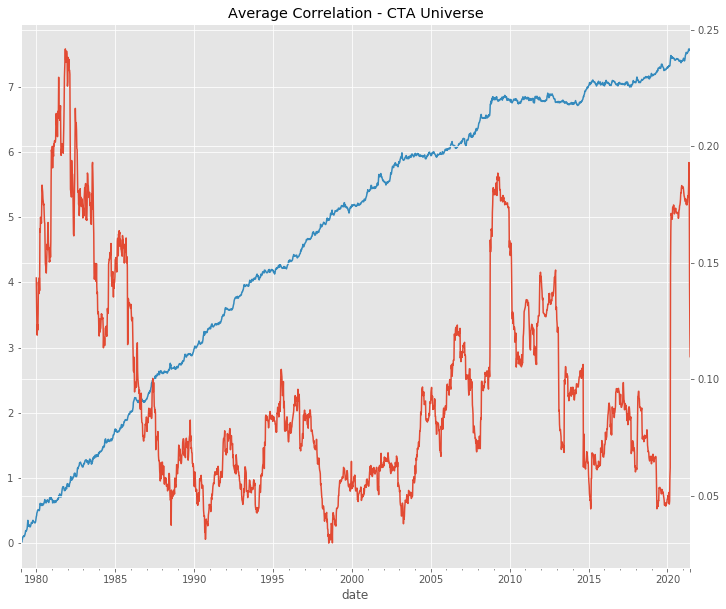

In [430]:
corrcomp_df = pd.concat([cta_df.loc['1979':, 'combined'], rhohat_df['1980':]], axis=1).rename(columns={0: 'rho_hat'})
corrcomp_df['rho_hat'].plot(secondary_y=True)
comp_df.loc['1979':,'ensemble'].cumsum().plot()
plt.title('Average Correlation - CTA Universe')

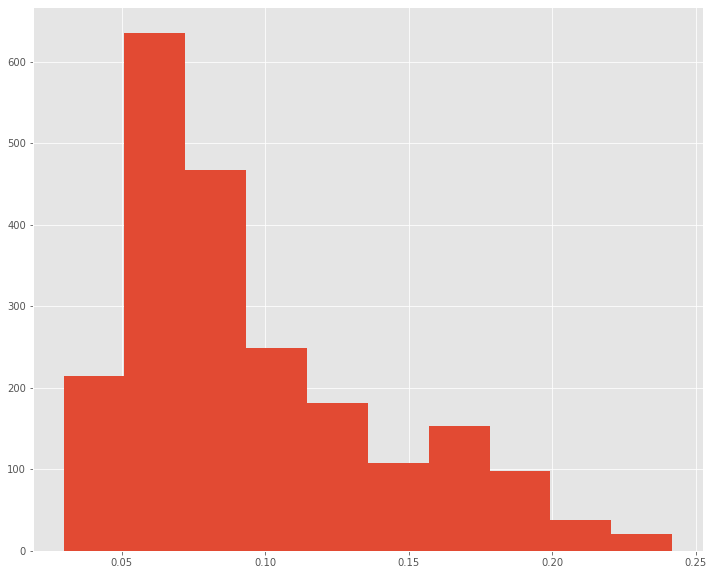

In [251]:
corrcomp_df['rho_hat'].hist()

Text(0.5, 1.0, 'Strategy Sharpe by Correlation Buckets')

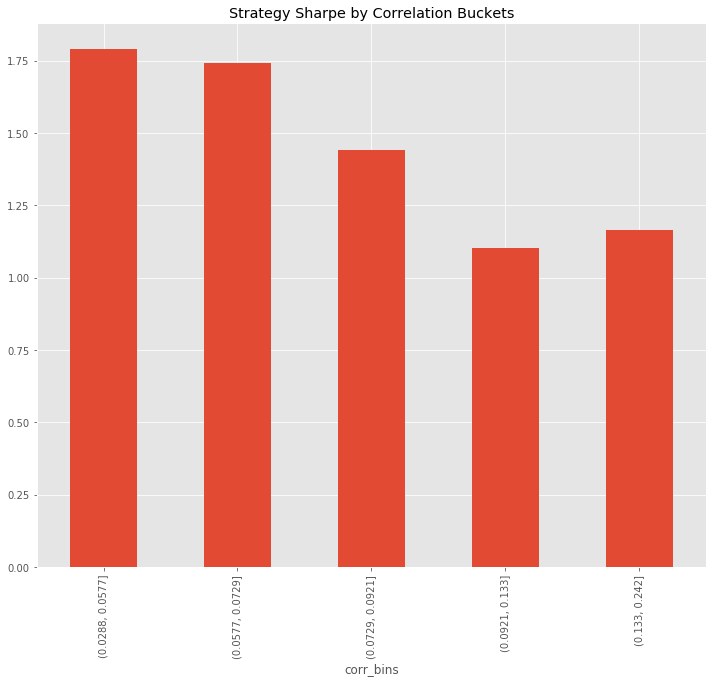

In [422]:
corrcomp_df['corr_bins'] = pd.qcut(corrcomp_df['rho_hat'],5)
corrcomp_df.groupby('corr_bins')['combined'].apply(lambda x: x.mean()*np.sqrt(52)/x.std()).plot(kind='bar')
plt.title('Strategy Sharpe by Correlation Buckets')

In [ ]:
tickers = ['BTCUSDT', 'ETHUSDT', 'BNBUSDT', 
           'ADAUSDT', 'XRPUSDT', 'DOTUSDT', 
          'BCHUSDT', 'SOLUSDT', 'LTCUSDT']

price_df = pd.DataFrame()
for ticker in tickers:
    price_df = pd.concat([price_df, cp.get_all_binance(ticker,'1d')['close']], axis=1)
    
price_df.columns = tickers

In [ ]:
df = sig_assets[['SP1 A:03_0_R Index', 'TY1 A:03_0_R Comdty']].pct_change(1).dropna()

y = df['SP1 A:03_0_R Index'].values
x = df['TY1 A:03_0_R Comdty'].values


delta = 1e-3
trans_cov = delta/(1-delta)*np.eye(2)
obs_mat = np.expand_dims(np.vstack([[x], [np.ones(len(x))]]).T, axis=1)

kf = pk.KalmanFilter(n_dim_obs=1, n_dim_state=2,
                  initial_state_mean=[0,0], 
                  initial_state_covariance=np.ones((2,2)),
                  transition_matrices=np.eye(2),
                  observation_matrices=obs_mat, 
                  observation_covariance=2,
                  transition_covariance=trans_cov)

state_mus, state_cov = kf.filter(y)
pd.Series(state_mus[:,0], index=df.index, name='betas').plot()
